In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from lib.imports import *
from lib.tools import *
from lib.utils import *
from lib.modules import *
from lib.data import *
from lib.xing import *
from lib.ipyjobs import *

In [4]:
G_list = load_G_list(data_path='data/rome', index_file='data_index.txt', cache='G_list', cache_prefix='cache/')

Load from 'cache/G_list.pickle'


In [5]:
data_list = generate_data_list(G_list, 
                               sparse=False, 
                               pivot_mode=None,
                               init_mode='pmds',
                               edge_index='full_edge_index',
                               edge_attr='full_edge_attr',
                               pmds_list=np.load('layouts/rome/pmds.npy', allow_pickle=True),
                               gviz_list=np.load('layouts/rome/gviz.npy', allow_pickle=True),
                               noisy_layout=True,
                               device='cpu', 
                               cache=True,
                               cache_prefix='cache/')

Load from 'cache/generate_data_list(list,sparse=False,pivot_mode=None,init_mode=pmds,edge_index=full_edge_index,edge_attr=full_edge_attr,pmds_list=ndarray,gviz_list=ndarray,noisy_layout=True,device=cpu).pickle'


In [18]:
data_list[0]

Data(edge_attr=[240, 2], edge_index=[2, 240], flip_edges=[16, 2], flip_edges_r=0.5133225882219997, flip_nodes=[16, 2], flip_nodes_r=0.8041190213864357, full_edge_attr=[240, 2], full_edge_index=[2, 240], gt_pos=[16, 2], m=21, movlsq=[16, 2], movlsq_r=0.8194833490960485, n=16, perturb=[16, 2], perturb_r=0.40693084956868475, phantom=[16, 2], phantom_r=0.5449339035674807, pos=[16, 2], random_normal=[16, 2], random_normal_r=0.05335406435272738, random_uniform=[16, 2], random_uniform_r=0.4225469235128986, raw_edge_index=[2, 42], x=[16])

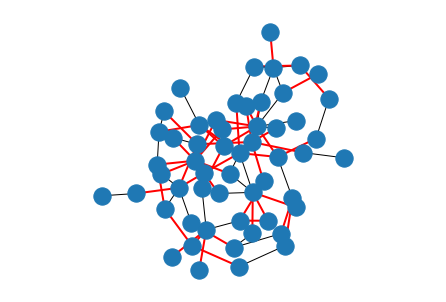

In [15]:
idx = 5
intersections = get_xing(G_list[idx], data_list[idx].gt_pos)
vis_xing(G_list[idx], data_list[idx].gt_pos, intersections)
plt.axis('equal')
plt.show()

  0%|          | 0/11531 [00:00<?, ?it/s]

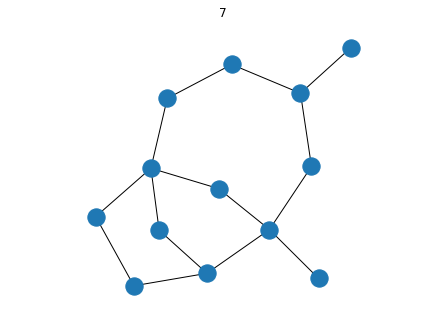

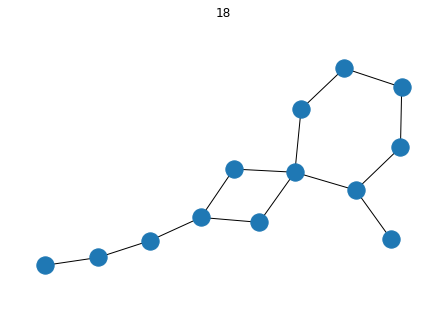

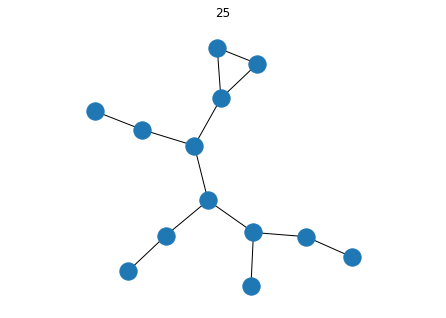

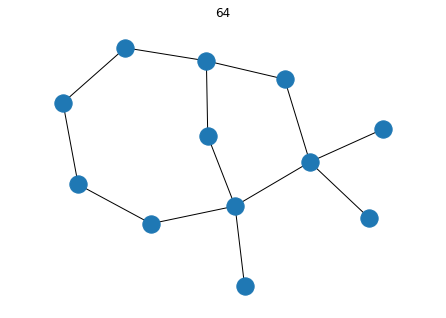

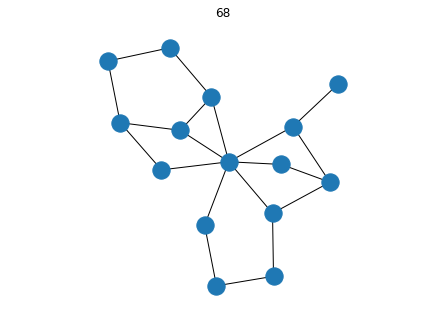

...

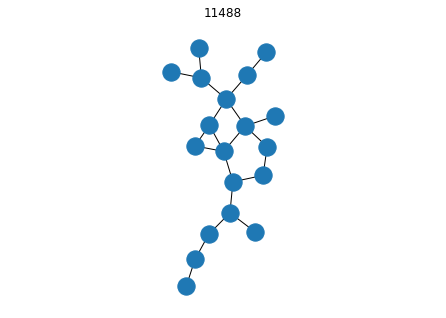

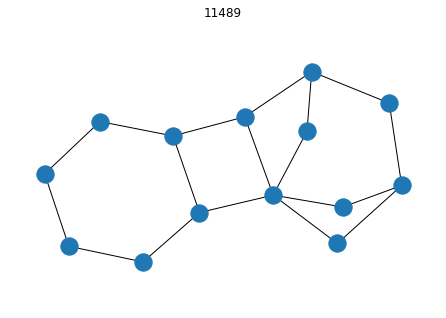

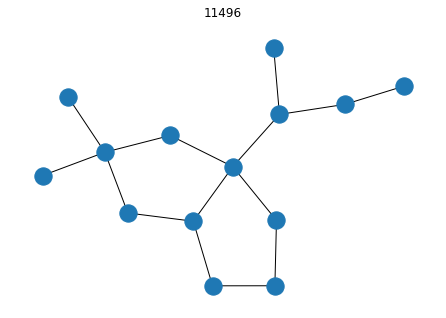

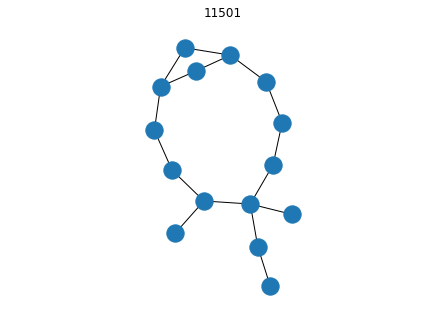

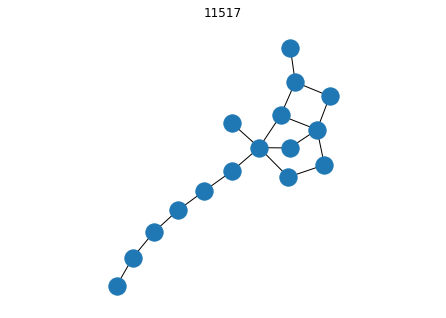

In [17]:
for idx in tqdm(range(11531)):
    if G_list[idx].number_of_nodes() > 25: continue
    intersections = get_xing(G_list[idx], data_list[idx].gt_pos)
    if len(intersections) > 0: continue
    vis_xing(G_list[idx], data_list[idx].gt_pos, intersections)
    plt.axis('equal')
    plt.title(str(idx))
    plt.show()

In [6]:
def generate_num_xing(G_list, data_list, layout):
    n_xing = []
    for G, data in zip(tqdm(G_list), data_list):
        n_xing.append(len(get_xing(G, data[layout])))
    np.save(f"num_xing_{layout}.npy", np.array(n_xing))
    return np.array(n_xing)

In [7]:
layouts = ["gt_pos", "perturb", "phantom", "random_normal", "random_uniform", "flip_edges", "flip_nodes", "movlsq"]

In [ ]:
n_xing = list(tqdm(map(get_n_xing, G_list, data_list, [layouts[0]] * len(G_list)), total=len(G_list)))

In [8]:
executor = concurrent.futures.ProcessPoolExecutor(16)
for layout in layouts[6:]:
    pos_list = map(lambda d: d[layout], data_list)
    n_xing = list(tqdm(executor.map(get_n_xing, G_list, pos_list), total=len(G_list)))
    np.save(f"num_xing_{layout}.npy", np.array(n_xing))

  0%|          | 0/11531 [00:00<?, ?it/s]

  0%|          | 0/11531 [00:00<?, ?it/s]

In [24]:
%%job
generate_num_xing(G_list, data_list, layouts[0], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [25]:
%%job
generate_num_xing(G_list, data_list, layouts[1])

  0%|          | 0/11531 [00:00<?, ?it/s]

In [26]:
%%job
generate_num_xing(G_list, data_list, layouts[2], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [27]:
%%job
generate_num_xing(G_list, data_list, layouts[3], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [28]:
%%job
generate_num_xing(G_list, data_list, layouts[4], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [29]:
%%job
generate_num_xing(G_list, data_list, layouts[5], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [30]:
%%job
generate_num_xing(G_list, data_list, layouts[6], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]

In [31]:
%%job
generate_num_xing(G_list, data_list, layouts[7], cache=True)

  0%|          | 0/11531 [00:00<?, ?it/s]